## MC38 Spheroid Viability Quantification

This notebook will analyze MC38 spheroid images containing a bright-field channel and two fluorescent channels with dyes to identify live and dead cells.  These images were taken under 3 conditions: 

1. **Control**: In this condition, cells were cultured with no treatment
2. **1% DMSO**: Slight DMSO treatment intended to kill cells with limited efficiency
3. **10% DMSO**: DMSO treatment intended to kill nearly all cells

The output of this analysis includes 2 primary objectives:

- The viability of cells in each spheroid (for each condition)
- Stitched images of all tiles filtered to valid spheroid objects

Note that this last objective requires selecting objects based on results from the Cytokit pipeline and then projecting those choices onto stitched experiment images.  In other words, the pipeline produces a data frame with properties for each object (cell usually, but not in this case) in each row and this notebook will select the desirable objects based on those properties and visualize those selections by matching them to objects in images.

Additionally, as this dataset concerns spheroids rather than cells, a [custom segmentation algorithm](spheroid_cytometer.py) was applied to generate the per-object data analyzed here. 

In [1]:
%matplotlib inline
import os
import tqdm
import numpy as np
import pandas as pd
import os.path as osp
import matplotlib.pyplot as plt
import plotnine as pn
from cytokit import io as ck_io
from cytokit import config as ck_config
from cytokit.function import data as ck_data
from cytokit.image import proc as ck_img_proc

### Loading

Define a set of experiment conditions for which all operations will be repeated:

In [2]:
# Pull a set of directory -> condition mappings
df_exp = pd.read_csv('experiments.csv')
df_exp

,name,dir,condition
0,20190215-mc38-dmso-control,XY02,DMSO-10p
1,20190215-mc38-dmso-control,XY03,DMSO-01p
2,20190215-mc38-dmso-control,XY07,DMSO-00p


Load the segmented object data as well as images associated with each object:

In [15]:
def output_dir(name, directory):
    return osp.join(os.environ['CYTOKIT_DATA_DIR'], 'cytokit', 'mc38-spheroid', name, directory, 'output', 'v00')

# Configure display settings for individual spheroid images
ranges = {
    'proc_BF': [0, np.inf],
    'proc_LIVE': [0, np.inf],
    'proc_DEAD': [0, np.inf],
    'cyto_cell_boundary': [0, 1]
}
colors = {
    'proc_BF': 'gray',
    'proc_LIVE': 'green',
    'proc_DEAD': 'red',
    'cyto_cell_boundary': 'cyan',
    # Disable all other channels in extraction
    'cyto_cell_mask': 'none'
    'cyto_basin': 'none',
    'cyto_gradbin': 'none',
    'cyto_gradient': 'none',
    'cyto_markers': 'none'
}

def get_data(exp_name, exp_dir):
    out_dir = output_dir(exp_name, exp_dir)    
    conf_dir = osp.join(out_dir, 'config')
    config = ck_config.load(conf_dir)
    df = ck_data.get_cytometry_data(out_dir, config, mode='best_z_plane')
    df['exp_dir'] = exp_dir
    df['out_dir'] = out_dir
    df['conf_dir'] = conf_dir
    df = ck_data.get_single_cell_image_data(out_dir, df, 'segm', ranges=ranges, colors=colors, image_size=(512, 512), apply_mask=True)
    return df
    
df = pd.concat([
    get_data(r['name'], r['dir']).assign(name=r['name'], condition=r['condition'])
    for i, r in df_exp.iterrows()
])

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 357 entries, 0 to 166
Data columns (total 74 columns):
region_index                  357 non-null int64
tile_index                    357 non-null int64
tile_x                        357 non-null int64
tile_y                        357 non-null int64
rid                           357 non-null int64
rx                            357 non-null float64
ry                            357 non-null float64
id                            357 non-null int64
x                             357 non-null float64
y                             357 non-null float64
z                             357 non-null int64
cm:size                       357 non-null float64
cm:size_vx                    357 non-null int64
cm:diameter                   357 non-null float64
cm:diameter_vx                357 non-null float64
cm:perimeter                  357 non-null float64
cm:solidity                   357 non-null float64
cm:circularity                357 non-null f

### Gating

Filter objects based on their size and texture.  In this case, spheroids are generally large (60+ um) and have a non-uniform texture in bright-field images.  Both size and texture are a good way to isolate valid spheroids while ignoring individual cells or large, homogenous image regions.  Here, both size and texture filters are applied with all following operations limited to only objects passing these restrictions:

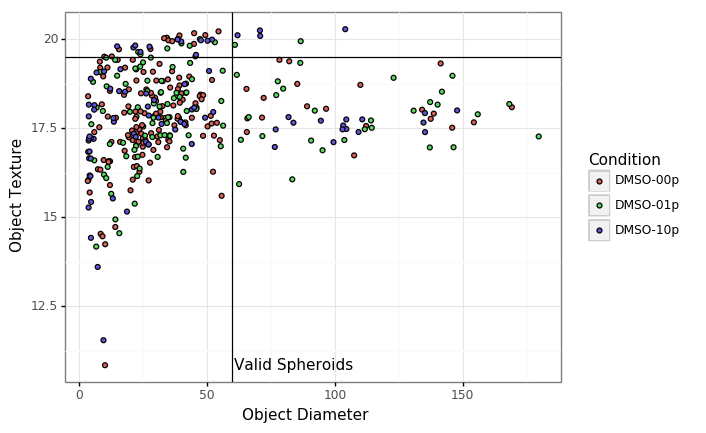

<ggplot: (-9223363282286490620)>

In [17]:
# Gate based on diameter and texture features (i.e. we want larger objects and objects with non-uniform bright-field texture)
xv, yv = 'cm:diameter', 'cm:BF:lbp:mean'
xt, yt = 60, 19.5
xv, yv, xt, yt

# Show gate on diameter + texture
(
    pn.ggplot(df, pn.aes(x=xv, y=yv, fill='condition')) +
    pn.geom_point() + 
    pn.geom_vline(xintercept=xt) + 
    pn.geom_hline(yintercept=yt) +
    pn.annotate('text', x=xt + 24, y=df[yv].min(), label='Valid Spheroids') +
    pn.theme_bw() + 
    pn.labs(x='Object Diameter', y='Object Texture', fill='Condition')
)

In [18]:
# Get objects passing size + texture filter
dfp = df[(df[xv] >= xt) & (df[yv] <= yt)][[
    'id', 'tile_x', 'tile_y',
    'exp_dir', 'out_dir', 'conf_dir', 'condition', 
    'image', 'cm:diameter', 'cm:BF:lbp:mean', 'ci:LIVE:mean', 'ci:DEAD:mean'
]]
dfp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 64 entries, 0 to 154
Data columns (total 12 columns):
id                64 non-null int64
tile_x            64 non-null int64
tile_y            64 non-null int64
exp_dir           64 non-null object
out_dir           64 non-null object
conf_dir          64 non-null object
condition         64 non-null object
image             64 non-null object
cm:diameter       64 non-null float64
cm:BF:lbp:mean    64 non-null float64
ci:LIVE:mean      64 non-null float64
ci:DEAD:mean      64 non-null float64
dtypes: float64(4), int64(3), object(5)
memory usage: 6.5+ KB


In [19]:
# Show number of spheroids by condition
dfp['condition'].value_counts()

DMSO-01p    28
DMSO-00p    20
DMSO-10p    16
Name: condition, dtype: int64

### Visualization

Show all valid spheroids for each condition:

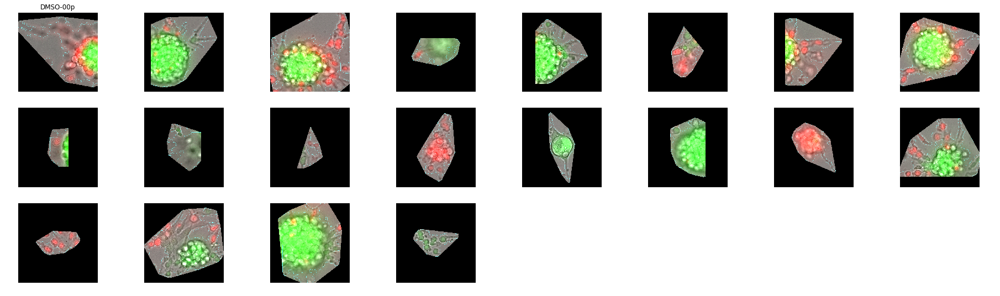

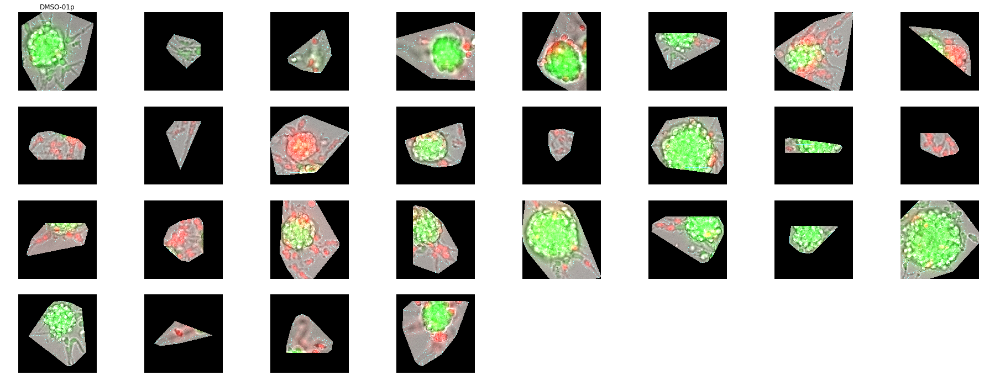

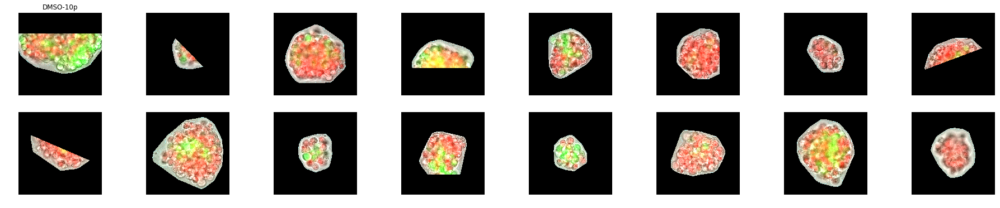

In [31]:
# Render individual spheroids under each condition
for k, g in dfp.groupby('condition'):
    images = g['image']
    cols = 8
    n = len(images)
    rows = int(np.ceil(n / cols))
    fig, axs = plt.subplots(rows, cols)
    axs = axs.ravel()
    for ax in axs:
        ax.axis('off')
    fig.set_size_inches(cols*4, rows*3)
    axs[0].set_title(k)
    for i, img in enumerate(images):
        axs[i].axis('off')
        axs[i].imshow(img)

Show spheroid viability distribution for each condition (At TOW, untreated and 1% DMSO groups were nearly identical while spheroids in 10% DMSO group were comprised nearly entirely of dead cells):

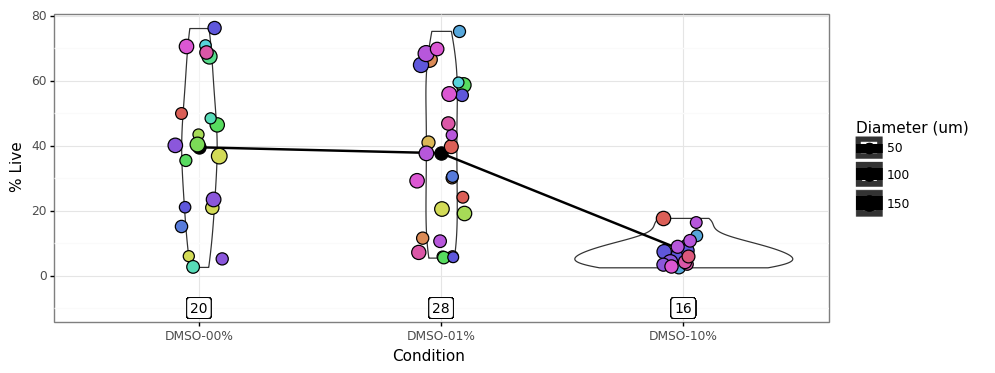

<ggplot: (-9223363282294594542)>

In [32]:
# Determine average cell viability within each spheroid by dividing total live intensity by live intensity + dead intensity
dfplt = (
    dfp
    .assign(pct=lambda df: 100 * df['ci:LIVE:mean'] / (df['ci:LIVE:mean'] + df['ci:DEAD:mean']))
    .assign(condition=lambda df: df['condition'].str.replace('p$', '%'))
    .assign(condition=lambda df: pd.Categorical(df['condition'], categories=sorted(df['condition'].unique()), ordered=True))
    .assign(id=lambda df: df['id'].astype(str))
    .assign(text=lambda df: df['condition'].map(df.groupby('condition').size()))
)
(
    pn.ggplot(dfplt, pn.aes(x='condition', y='pct', size='cm:diameter')) + 
    pn.geom_violin(alpha=.5) + 
    pn.geom_point(data=dfplt.groupby('condition')[['pct', 'cm:diameter']].mean().reset_index(), color='black', shape='o') + 
    pn.geom_line(
        mapping=pn.aes(x='condition', y='pct', group=1, size=1), 
        data=dfplt.groupby('condition')[['pct', 'cm:diameter']].mean().reset_index(), color='black'
    ) + 
    pn.geom_jitter(pn.aes(fill='id'), width=.1) + 
    pn.geom_label(pn.aes(label='text', y=-10), size=10) +
    pn.labs(x='Condition', y='% Live', fill='Spheroid ID', size='Diameter (um)') +
    pn.scale_fill_discrete(guide=False) + 
    pn.theme_bw() + 
    pn.theme(figure_size=(10, 4))
    
)

Show montage images (of all tiles) for each condition with valid spheroids highlighted:

In [33]:
from cytokit.image import ops as image_ops
from cytokit.image import proc as image_proc
from skimage import morphology

def get_montage(out_dir, df, config, grid_size=3, boundary_size=10):
    path = osp.join(out_dir, 'montage', 'segm', 'R001.tif')
    img, meta = ck_io.read_tile(path, return_metadata=True)
    imgs = img[0, 0, [meta['labels'].index(c) for c in ['proc_BF', 'proc_LIVE', 'proc_DEAD', 'cyto_cell_boundary']]]
    
    # Restrict object label image to object ids matching data frame (and dilate boundary to make larger for visualization)
    imgs[-1] = image_ops.filter_label_image(imgs[-1], df, config)
    imgs[-1] = morphology.dilation(imgs[-1] > 0, selem=morphology.disk(boundary_size)) * np.iinfo(img.dtype).max       
    
    # Merge multi-channel image into single RGB
    img = image_proc.get_image_processor(
        # Note that these channel names must match order of imgs above
        ['BF', 'LIVE', 'DEAD', 'OBJ'], 
        ranges={'OBJ': [0, 1], 'BF': [np.iinfo(img.dtype).max*.5, None]},
        colors={'BF': 'gray', 'LIVE': 'green', 'DEAD': 'red', 'OBJ': 'blue'}
    ).run(imgs)
    
    # Draw grid lines at imaging tile borders
    if grid_size:
        img_grid = np.zeros(img.shape[:2], dtype='bool')
        for ri in range(config.region_height):
            img_grid[ri*config.tile_height, :] = True
        for ci in range(config.region_width):
            img_grid[:, ci*config.tile_width] = True
        img_grid = morphology.binary_dilation(img_grid, selem=morphology.disk(grid_size))
        img[img_grid > 0] = 0

    return img


imgs = {}
for k, g in dfp.groupby('condition'):
    out_dir = g['out_dir'].iloc[0]
    config = ck_config.load(g['conf_dir'].iloc[0])
    imgs[k] = get_montage(out_dir, g, config, grid_size=3)

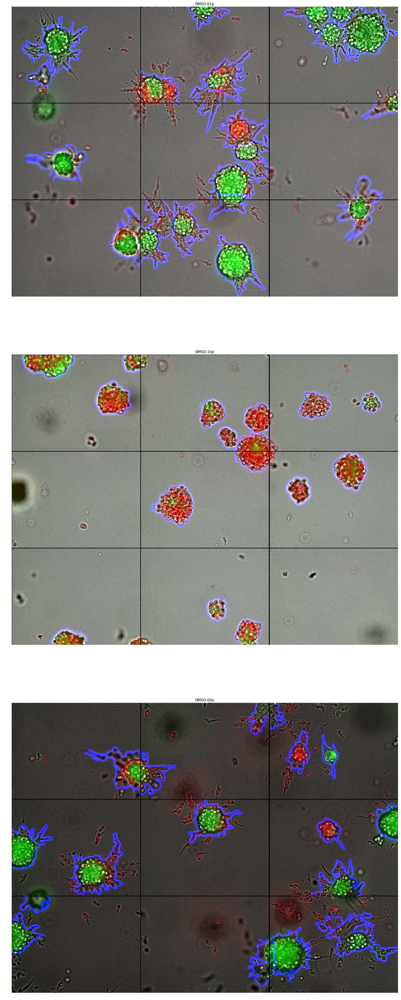

In [34]:
fig, ax = plt.subplots(len(imgs), 1)
fig.set_size_inches(48*len(imgs), 60)
for i, (k, img) in enumerate(imgs.items()):
    ax[i].set_title(k)
    ax[i].imshow(img)
    ax[i].axis('off')